In [1]:
from glob import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import json

# New Implementation

In [3]:
arrays=sorted(glob("020123_114915 Cube (1)/*.json"))

In [4]:
f = open(arrays[-1])
data = json.load(f)

In [5]:
l2=[]
for x in range(80*512):
    if x not in data["instances"]:
        l2.append(0)
    else:
        
        l2.append(data["Values"][data["instances"].index(x)])
    

In [6]:
l1 = np.arange(80*512)
l2=np.where(np.isin(l1, data["instances"]), data["Values"], 0)

ValueError: operands could not be broadcast together with shapes (40960,) (368,) () 

In [7]:
values_dict = {}
for instance, value in zip(data["instances"], data["Values"]):
    values_dict[instance] = value

l2 = [values_dict.get(x, 0) for x in range(80*512)]


In [5]:
beta(phi_vals,Lv=18.8)

array([-1.78563521e-01,  5.30348252e-02,  9.31324986e-01,  5.72121772e-01,
       -1.88263319e-01, -4.60971093e-02,  1.27799457e-01,  6.91829445e-02,
        7.45264704e-03,  8.95722730e-03,  7.31881574e-02,  1.26714742e-01,
       -6.05185807e-02, -1.75119105e-01,  6.17516171e-01,  9.06661631e-01,
        1.74594439e-02, -1.67508752e-01,  9.55438215e-02,  1.03948045e-01,
        2.55885650e-02,  5.44998385e-04,  4.03079647e-02,  1.19470178e-01,
        5.31156409e-02, -2.09944104e-01,  2.10831968e-01,  9.92214388e-01,
        3.89168927e-01, -2.15806625e-01,  7.39377609e-03,  1.26922790e-01,
        5.40740411e-02,  2.93083547e-03,  1.61948335e-02,  8.89328015e-02,
        1.16467540e-01, -1.16832725e-01, -9.85881526e-02,  7.80254140e-01,
        7.80254140e-01, -9.85881526e-02, -1.16832725e-01,  1.16467540e-01,
        8.89328015e-02,  1.61948335e-02,  2.93083547e-03,  5.40740411e-02,
        1.26922790e-01,  7.39377609e-03, -2.15806625e-01,  3.89168927e-01,
        9.92214388e-01,  

In [41]:
angle_v=20
bins_vert=512
def beta(phi,Lv,f=750,c=c_calc):
    coeff=np.sin(phi)*Lv/(c/f)
    return(np.sin(coeff)/coeff)

phi_vals=np.linspace(-angle_v/2,angle_v/2,bins_vert)
beta_vals={}
for phi_val in phi_vals:
    beta_vals[str(phi_val)]=beta(phi_val,Lv=18.8)


In [42]:
def alpha(theta,phi,Lh,f=750,c=c_calc):
    coeff=np.sin(theta)*np.sin(phi)*Lh/(c/f)
    return(np.sin(coeff)/coeff)

In [43]:
angle=130
bins_size=512
theta_vals=np.linspace(-angle/2,angle/2,bins_size)

alpha_vals_list=[]
for phi_val in phi_vals:
    for theta_val in theta_vals:
        alpha_vals_list.append(alpha(theta_val,phi_val,Lh=18.8))
        #alpha_vals[str([theta_val,phi_val])]=alpha(theta_val,phi_val,Lh=18.8)

In [44]:
beam_pattern_1=np.array_split(np.array(alpha_vals_list),512)

In [45]:
len((beam_pattern_1+beta(phi_val,Lv=18.8))[1])

512

In [46]:
def alpha_vals_calc(Lh_val):
    alpha_vals_list=[]
    for phi_val in phi_vals:
        for theta_val in theta_vals:
            alpha_vals_list.append(alpha(np.deg2rad(theta_val),np.deg2rad(phi_val),Lh=Lh_val))
    return(alpha_vals_list)
alpha_vals_list_1=alpha_vals_calc(60.16)
beam_pattern_r=np.array_split(np.array(alpha_vals_list_1),512)+beta(np.deg2rad(phi_vals),Lv=18.8)
alpha_vals_list_2=alpha_vals_calc(0.4275)
beam_pattern_t=np.array_split(np.array(alpha_vals_list_2),512)+beta(np.deg2rad(phi_vals),Lv=9.4)
beam_pattern=beam_pattern_r+beam_pattern_t

In [47]:
beam_pattern[1]

array([2.29019623, 2.29315597, 2.29612362, 2.29909979, 2.30208509,
       2.30508012, 2.3080855 , 2.31110188, 2.31412988, 2.31717017,
       2.32022339, 2.32329023, 2.32637135, 2.32946745, 2.33257921,
       2.33570734, 2.33885255, 2.34201557, 2.34519712, 2.34839794,
       2.35161877, 2.35486036, 2.35812348, 2.3614089 , 2.36471739,
       2.36804972, 2.3714067 , 2.37478912, 2.37819778, 2.38163349,
       2.38509706, 2.38858932, 2.3921111 , 2.39566322, 2.39924653,
       2.40286186, 2.40651007, 2.41019201, 2.41390853, 2.41766048,
       2.42144874, 2.42527417, 2.42913764, 2.43304002, 2.43698218,
       2.44096499, 2.44498933, 2.44905608, 2.45316612, 2.45732032,
       2.46151955, 2.46576469, 2.47005663, 2.47439622, 2.47878434,
       2.48322186, 2.48770964, 2.49224854, 2.49683942, 2.50148314,
       2.50618053, 2.51093243, 2.51573969, 2.52060314, 2.52552358,
       2.53050183, 2.53553871, 2.54063499, 2.54579147, 2.55100893,
       2.55628812, 2.56162979, 2.5670347 , 2.57250356, 2.57803

In [39]:
plt.figure(figsize=(15,15))
plt.imshow(cv2.resize(x.astype(np.uint8),(500,500)),cmap="gray")
plt.savefig("C:\\Users\\abuba\\Desktop\\img.jpg")

AttributeError: 'int' object has no attribute 'astype'

<Figure size 1080x1080 with 0 Axes>

In [2]:
def c(T=25,S=0.01,z=2):
    if((0<T and T<=35) and (0<S and S<=45)and (0<z and z<=1000)):
        c_val=1449.2+4.6*T-0.055*T**2+0.00029*T**3+(1.34-0.01*T)*(S-35)+0.016*z
        return c_val
    else:
        print("Check values")
        return -1

In [3]:
c_calc=c()

In [11]:
def a_w(c_val=c_calc,ph=7,S=45,z_max=4,f=750,T=25):
    
    A1=(8.696/c_val)*10**(0.78*ph-5)
    f1=2.8*np.sqrt(S/35)*10**(4-(1245/(T+273)))
    P1=1
    
    A2=21.44*(S/c_val)*(1+0.025*T)
    f2=(8.17*10**(8-1990/(T+273)))/(1+0.0018*(S-35))
    P2=1-1.37*z_max*10**-4+6.2*(z_max**2)*(10**-9)
    
    if(T<=20):
        A3=4.937*(10**-4)-2.59*(10**-5)*T+9.11*(10**-7)*(T**2)-1.5*(10**-8)*(T**3)
    else:
        A3=3.964*(10**-4)-1.146*(10**-5)*T+1.45*(10**-7)*(T**2)-6.5*(10**-10)*(T**3)
    P3=1-3.83*z_max*10**-5+4.9*(z_max**2)*(10**-10)

    a_w_val=(A1*P1*f1*f**2)/(f1**2+f**2)+(A2*P2*f2*f**2)/(f2**2+f**2)+A3*P3*f**2
    return a_w_val

In [12]:
a_w_calc=a_w()

In [13]:
def a_t(d,a_w_val=a_w_calc):
    return ((2*d-1)*a_w_val/1000)

In [14]:
def S_L(d):
    return 40*np.log10(d)

In [15]:
T_L=a_t(b1)+S_L(b1)

NameError: name 'b1' is not defined

In [16]:
def S_v(f=750,pref=2):
    if(pref==1):
        S_p=-50
    elif(pref==2):
        S_p=-70
    elif(pref==3):
        S_P=-90
    return (S_p+7*np.log10(f))
Sv_calc=S_v()

In [35]:
def RL_V_old(dist_list,T_L,f=750,Sv_val=Sv_calc,BP=0):
    l1=[]
    dist_list=np.insert(dist_list,0,0)
    for i in range(len(dist_list)-1):
        V1=(4/3)*np.pi*dist_list[i+1]
        V2=(4/3)*np.pi*dist_list[i]
        l1.append(Sv_val+10*np.log10(V1-V2)+BP)
        #Extra 10 for BP which is not yet coded
    return(l1-T_L)

In [38]:
RL_V_old(dists,T_L)

array([ -15.51062328,  -31.71350483,  -40.71620611,  -46.69019177,
        -51.18487243,  -54.79979845,  -57.83075335,  -60.44560335,
        -62.74884716,  -64.80997411,  -66.67754337,  -68.38682782,
        -69.96425852,  -71.43015328,  -72.80046779,  -74.08796127,
        -75.30299715,  -76.45410771,  -77.54840155,  -78.59186375,
        -79.58958083,  -80.54591204,  -81.46462178,  -82.34898308,
        -83.20185962,  -84.02577122,  -84.8229468 ,  -85.59536752,
        -86.34480217,  -87.07283646,  -87.78089752,  -88.47027426,
        -89.14213477,  -89.79754087,  -90.43746069,  -91.06277935,
        -91.67430817,  -92.2727927 ,  -92.8589196 ,  -93.4333227 ,
        -93.99658828,  -94.54925972,  -95.09184158,  -95.62480319,
        -96.14858191,  -96.66358592,  -97.17019676,  -97.66877163,
        -98.15964541,  -98.64313246,  -99.11952827,  -99.58911096,
       -100.0521426 , -100.50887043, -100.95952792, -101.40433585,
       -101.84350315, -102.27722773, -102.70569731, -103.12909

In [39]:
RL_V(dists,T_L)

array([ -15.51062328,  -31.71350483,  -40.71620611,  -46.69019177,
        -51.18487243,  -54.79979845,  -57.83075335,  -60.44560335,
        -62.74884716,  -64.80997411,  -66.67754337,  -68.38682782,
        -69.96425852,  -71.43015328,  -72.80046779,  -74.08796127,
        -75.30299715,  -76.45410771,  -77.54840155,  -78.59186375,
        -79.58958083,  -80.54591204,  -81.46462178,  -82.34898308,
        -83.20185962,  -84.02577122,  -84.8229468 ,  -85.59536752,
        -86.34480217,  -87.07283646,  -87.78089752,  -88.47027426,
        -89.14213477,  -89.79754087,  -90.43746069,  -91.06277935,
        -91.67430817,  -92.2727927 ,  -92.8589196 ,  -93.4333227 ,
        -93.99658828,  -94.54925972,  -95.09184158,  -95.62480319,
        -96.14858191,  -96.66358592,  -97.17019676,  -97.66877163,
        -98.15964541,  -98.64313246,  -99.11952827,  -99.58911096,
       -100.0521426 , -100.50887043, -100.95952792, -101.40433585,
       -101.84350315, -102.27722773, -102.70569731, -103.12909

In [18]:


def RL_V(dist_list, T_L, f=750, Sv_val=Sv_calc, BP=0):
    dist_list = np.insert(dist_list, 0, 0)
    V_diff = (4/3) * np.pi * np.diff(dist_list)
    l1 = Sv_val + 10 * np.log10(V_diff)
    return l1 - T_L + BP


In [19]:
def I_R(a1, T_L, BP=0, TS=0):
    return np.where(a1 == 0, 0, np.add(-T_L, BP + TS))

In [43]:
bins=[]
e=10**-5
bins_size=512
_a1,b1=np.histogram(l2,bins_size,range=[e,120])
dists=np.array([(b1[i]+b1[i+1])/2 for i in range (len(b1)-1)])
T_L=a_t(dists[:])+S_L(dists[:])
RL_V_val=RL_V(dist_list=dists,T_L=T_L)
T_L=a_t(dists)+S_L(dists)

In [44]:
T_L

array([-37.45387867, -18.24106774,  -9.23836646,  -3.2643808 ,
         1.23029986,   4.84522588,   7.87618077,  10.49103078,
        12.79427459,  14.85540153,  16.7229708 ,  18.43225525,
        20.00968594,  21.47558071,  22.84589521,  24.13338869,
        25.34842458,  26.49953513,  27.59382897,  28.63729118,
        29.63500825,  30.59133947,  31.5100492 ,  32.39441051,
        33.24728705,  34.07119864,  34.86837423,  35.64079495,
        36.39022959,  37.11826389,  37.82632494,  38.51570169,
        39.18756219,  39.8429683 ,  40.48288812,  41.10820677,
        41.7197356 ,  42.31822013,  42.90434703,  43.47875013,
        44.04201571,  44.59468715,  45.137269  ,  45.67023062,
        46.19400934,  46.70901334,  47.21562418,  47.71419906,
        48.20507284,  48.68855988,  49.16495569,  49.63453839,
        50.09757003,  50.55429785,  51.00495535,  51.44976328,
        51.88893057,  52.32265516,  52.75112474,  53.17451745,
        53.59300254,  54.00674093,  54.41588574,  54.82

In [21]:


for x in range(512):
    a1,b1=np.histogram(l2[80*(x):80*(x+1)],bins_size,range=[e,120])
    try:
        final_idx=np.max(np.nonzero(a1))
    except:
        final_idx=len(a1)
    
    
    
    #T_L=np.pad(T_L, (0,len(a1)-final_idx), 'constant')

    #print(T_L.shape)
    c1=RL_V_val+I_R(a1,T_L)
    c2=c1.reshape(bins_size,1)
    bins.append(c2)

    #bins.append(a1.reshape(bins_size,1))
    

In [22]:
hist, edges = np.histogram(l2, bins=bins_size, range=[e, 120])
bins = hist.reshape(-1, 1)
bins.shape

(512, 1)

In [52]:
l2_slices = np.array_split(l2, 512)
bins = []

for l2_slice in l2_slices:
    hist, edges = np.histogram(l2_slice, bins=bins_size, range=[e, 120])
    c1=RL_V_val+I_R(hist,T_L)
    c2=c1.reshape(bins_size,1)
    bins.append(c2.reshape(-1, 1))

In [53]:
x=np.concatenate(bins,axis=1)
x.shape

(512, 512)

In [54]:
polar_img=np.concatenate(bins,axis=1)
polar_img.shape

(512, 512)

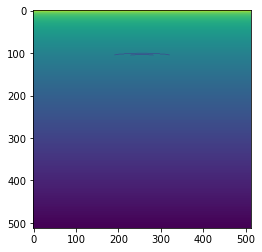

In [55]:
plt.imshow(polar_img)

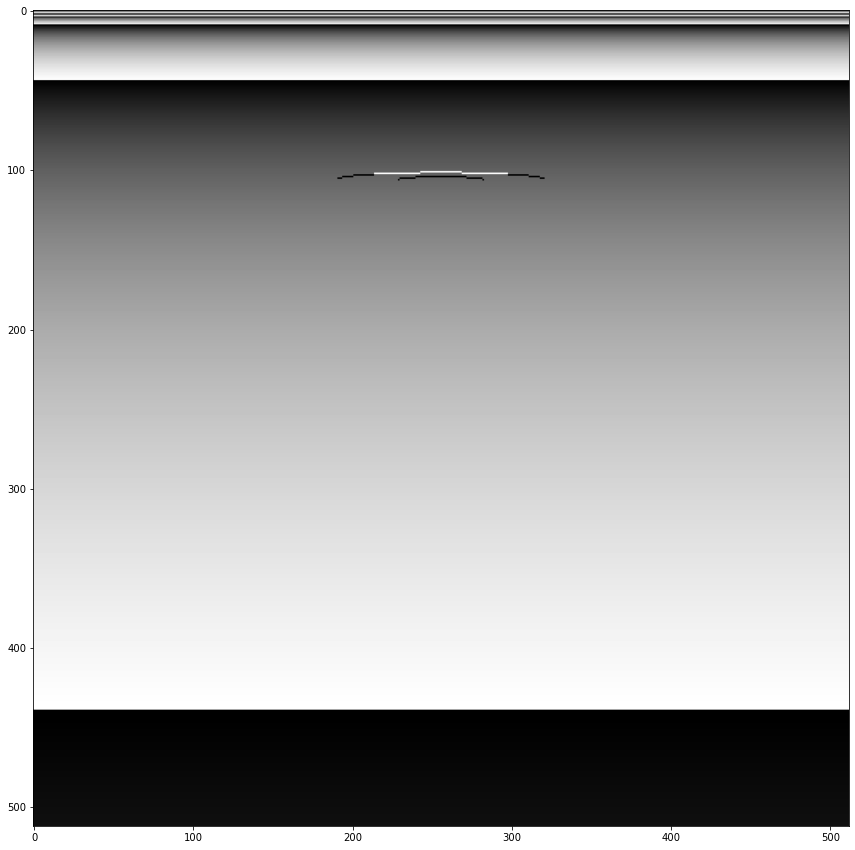

In [31]:
plt.figure(figsize=(15,15))
plt.imshow(np.uint8(255*(polar_img-np.min(polar_img))/polar_img-np.max(polar_img)),cmap="gray")
#plt.imshow(cv2.resize(polar_img.astype(np.uint8),(100,100)),cmap="gray_r")
#plt.savefig("C:\\Users\\abuba\\Desktop\\img.jpg")

In [135]:
import pandas as pd 
pd.DataFrame(x).to_csv("C:\\Users\\abuba\\Desktop\\file.csv")

ValueError: DataFrame constructor not properly called!

In [8]:
beams=512
cols=[r-beams/2 for r in range (beams)]

In [20]:
cols_cos=np.cos(np.deg2rad(lst_angles))

In [12]:
np.deg2rad(lst_angles).shape

(100,)

In [19]:
cols_sin=np.sin(np.deg2rad(lst_angles))

In [4]:
img=np.zeros((512,512))

In [26]:
for x in cols_cos:
    for y in cols_sin:
        img[200*np.int32(x),200*np.int32(y)]=255

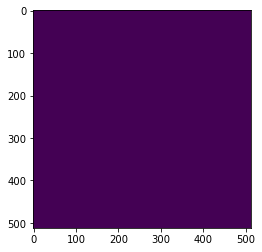

In [5]:
plt.imshow(img)

In [28]:
200*np.int32(x),200*np.int32(y)

(0, 0)

In [33]:
angle=130
shift=90-angle/2
angles=np.deg2rad(np.linspace(shift,180-shift,100))

In [34]:
size=100
i2=np.zeros([100,100])
for x in range(100):
    print(x)
    for y in angles:
        a=np.int32(x*np.cos(y))
        print(a,end=" ")
        for z in angles:
            
            
            b=np.int32(x*np.sin(z))
            
            print(b)
            i2[np.int32(a),np.int32(b)]=1

0
0 0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0 0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0 0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0 0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0 0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


In [55]:
def polar_to_cartesian(r, theta):
    x = r * np.cos(theta)
    y = r * np.sin(theta)
    return x, y

In [63]:
n_rows, n_cols = polar_img.shape

# Create an empty array to hold the Cartesian image
cartesian_image = np.empty((n_rows, n_cols))

# Convert each pixel in the polar image to Cartesian coordinates
for i in range(n_rows):
    for j in range(n_cols):
        r = polar_normal[i, j]*255
        theta = 2 * np.pi * j / n_cols
        r1, r2 = polar_to_cartesian(r, theta)
        cartesian_image[i, j] = (r1, r2)

ValueError: setting an array element with a sequence.

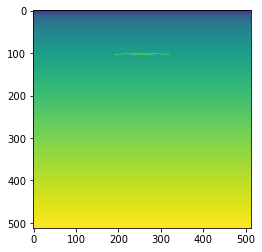

In [145]:
plt.imshow(polar_normal)

In [33]:
polar_normal=1-(polar_img-np.min(polar_img))/(np.max(polar_img)-np.min(polar_img))

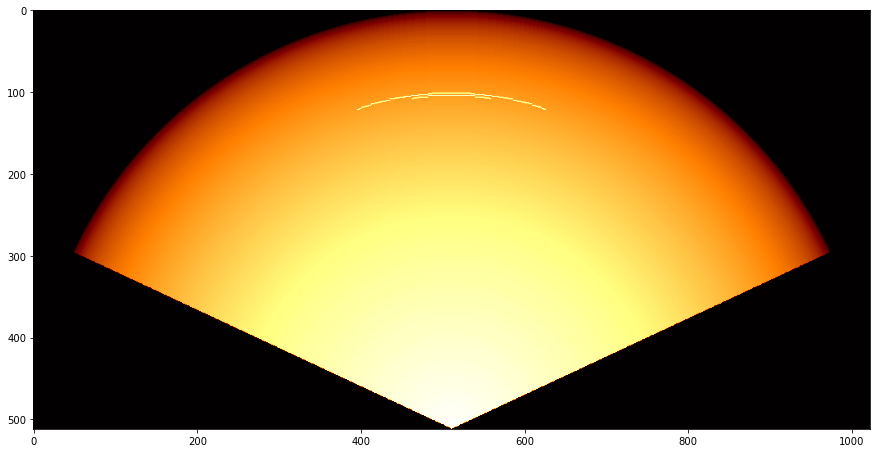

In [34]:
#x = np.rot90(polar_normal*255, 2)
x=polar_normal*255
top = False
angle = 130
r0 = 0
k = 100
h, w = x.shape
r = 2 * h - 1
im_fan = np.ones((r, r), dtype=np.uint8)
idx = np.arange(h) if top else np.arange(h)[::-1]
# 坐标转化，将角度转换为弧度，生成扇形角度序列
alpha = np.radians(np.linspace(-angle/2, angle/2, k*w))
for i in range(k*w):  # 遍历输入图像的每一列
    rows = np.int32(np.ceil(np.cos(alpha[i]) * idx)) + r // 2
    cols = np.int32(np.ceil(np.sin(alpha[i]) * idx)) + r // 2
    im_fan[(rows, cols)] = x[:, i//k]
im_fan = im_fan[r//2:, :]  # 裁切输出图像的空白区域
im_out = np.flip(im_fan, axis=0)
plt.figure(figsize=(15,15))
plt.imshow(im_out, 'afmhot')

TypeError: Invalid shape () for image data

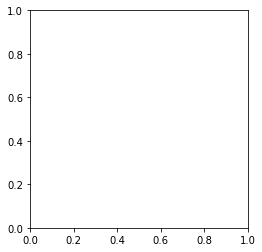

In [128]:
plt.imshow(x)

In [40]:
dists

array([1.17197490e-01, 3.51572471e-01, 5.85947451e-01, 8.20322432e-01,
       1.05469741e+00, 1.28907239e+00, 1.52344737e+00, 1.75782235e+00,
       1.99219733e+00, 2.22657231e+00, 2.46094729e+00, 2.69532228e+00,
       2.92969726e+00, 3.16407224e+00, 3.39844722e+00, 3.63282220e+00,
       3.86719718e+00, 4.10157216e+00, 4.33594714e+00, 4.57032212e+00,
       4.80469710e+00, 5.03907208e+00, 5.27344706e+00, 5.50782204e+00,
       5.74219702e+00, 5.97657200e+00, 6.21094698e+00, 6.44532196e+00,
       6.67969694e+00, 6.91407192e+00, 7.14844690e+00, 7.38282188e+00,
       7.61719687e+00, 7.85157185e+00, 8.08594683e+00, 8.32032181e+00,
       8.55469679e+00, 8.78907177e+00, 9.02344675e+00, 9.25782173e+00,
       9.49219671e+00, 9.72657169e+00, 9.96094667e+00, 1.01953217e+01,
       1.04296966e+01, 1.06640716e+01, 1.08984466e+01, 1.11328216e+01,
       1.13671966e+01, 1.16015715e+01, 1.18359465e+01, 1.20703215e+01,
       1.23046965e+01, 1.25390715e+01, 1.27734464e+01, 1.30078214e+01,
      

In [42]:
S_L(dists)

array([-37.24326754, -18.15940556,  -9.28565322,  -3.4406165 ,
         0.92511522,   4.4110923 ,   7.31309825,   9.79899932,
        11.97329418,  13.90547219,  15.64409251,  17.22442802,
        18.67290977,  20.0098556 ,  21.25122116,  22.4097657 ,
        23.49585264,  24.51801426,  25.48335916,  26.39787242,
        27.26664055,  28.09402283,  28.88378362,  29.63919599,
        30.36312358,  31.05808624,  31.72631288,  32.36978466,
        32.99027036,  33.58935572,  34.16846783,  34.72889564,
        35.2718072 ,  35.79826436,  36.30923524,  36.80560496,
        37.28818484,  37.75772043,  38.21489839,  38.66035254,
        39.09466918,  39.51839168,  39.9320246 ,  40.33603727,
        40.73086705,  41.11692211,  41.49458401,  41.86420994,
        42.22613478,  42.58067289,  42.92811976,  43.26875351,
        43.60283621,  43.93061509,  44.25232365,  44.56818264,
        44.87840099,  45.18317663,  45.48269727,  45.77714104,
        46.06667719,  46.35146664,  46.63166251,  46.90